In [17]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/btxrd-data/tumor_bone_statistics.xlsx
/kaggle/input/btxrd-data/BTXRD/BTXRD/~$dataset(total).xlsx
/kaggle/input/btxrd-data/BTXRD/BTXRD/dataset.xlsx
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG000966.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG001116.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG000811.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG000486.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG000397.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG001170.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG000120.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG001769.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG001658.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG000305.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG000122.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG001399.json
/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG001429.json
/kaggle

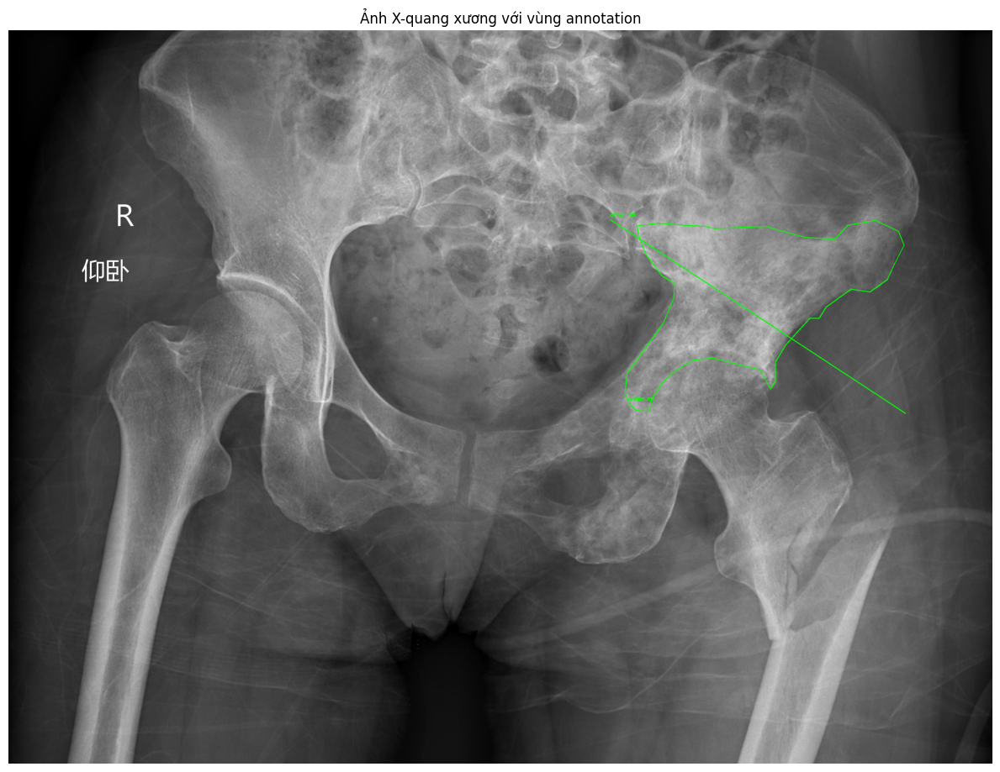

Đã lưu ảnh với annotation tại: /kaggle/input/btxrd-data/BTXRD/BTXRD/images/IMG000001_annotated.jpg


In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import json
import os

def load_image_and_annotation(image_path, json_path):
    """
    Đọc ảnh và dữ liệu annotation từ file
    
    Parameters:
    image_path (str): Đường dẫn đến file ảnh
    json_path (str): Đường dẫn đến file JSON chứa thông tin annotation
    
    Returns:
    tuple: (ảnh đã đọc, dữ liệu annotation)
    """
    # Kiểm tra tồn tại của file ảnh
    if not os.path.exists(image_path):
        print(f"Lỗi: Không tìm thấy ảnh {image_path}")
        return None, None
    
    # Kiểm tra tồn tại của file JSON
    if not os.path.exists(json_path):
        print(f"Lỗi: Không tìm thấy file annotation {json_path}")
        return None, None
    
    # Đọc ảnh
    image = cv2.imread(image_path)
    
    # Đọc dữ liệu annotation từ file JSON
    try:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)
        return image, data
    except Exception as e:
        print(f"Lỗi khi đọc file JSON: {e}")
        return image, None

def visualize_annotation(image_path, json_path):
    """
    Hiển thị ảnh với các annotation
    
    Parameters:
    image_path (str): Đường dẫn đến file ảnh
    json_path (str): Đường dẫn đến file JSON chứa thông tin annotation
    """
    # Đọc ảnh và dữ liệu annotation
    image, data = load_image_and_annotation(image_path, json_path)
    
    # Kiểm tra dữ liệu đã đọc thành công
    if image is None:
        print(f"Lỗi: Không tìm thấy ảnh {image_path}")
        return
    
    if data is None:
        print(f"Lỗi: Không thể đọc dữ liệu annotation từ {json_path}")
        return
    
    # Vẽ annotation
    for shape in data["shapes"]:
        label = shape["label"]  # Nhãn vùng annotation
        points = np.array(shape["points"], dtype=np.int32)  # Tọa độ vùng
        
        # Chọn màu cho annotation
        color = (0, 255, 0)  # Mặc định xanh lá
        if "Fracture" in label:
            color = (0, 0, 255)  # Đỏ nếu là gãy xương
        elif "Tumor" in label:
            color = (255, 0, 0)  # Xanh dương nếu là khối u
        
        # Vẽ đường viền vùng annotation
        cv2.polylines(image, [points], isClosed=True, color=color, thickness=2)
        
        # Hiển thị nhãn trên ảnh
        x, y = points[0]
        cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
    
    # Hiển thị ảnh đã annotate
    plt.figure(figsize=(12, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Ảnh X-quang xương với vùng annotation")
    plt.axis("off")
    plt.tight_layout()
    plt.show()
    
    # Lưu ảnh đã annotate (tùy chọn)
    output_path = os.path.splitext(image_path)[0] + "_annotated.jpg"
    cv2.imwrite(output_path, image)
    print(f"Đã lưu ảnh với annotation tại: {output_path}")

# Ví dụ sử dụng
if __name__ == "__main__":
    
    image_path = "/kaggle/input/btxrd-data/BTXRD/BTXRD/images/IMG000001.jpeg"
   
    json_path = "/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations/IMG000001.json"
    
    # Hiển thị ảnh với annotation
    visualize_annotation(image_path, json_path)

In [19]:
# Kiểm tra số lượng ảnh có trong dataset
import os
import json
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm  # Thêm tqdm để hiển thị tiến độ
import matplotlib.pyplot as plt

# Thư mục chứa dữ liệu
image_dir = '/kaggle/input/btxrd-data/BTXRD/BTXRD/images'
annotation_dir = '/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations'

# Kích thước ảnh chuẩn hóa
IMG_SIZE = 224

# Tạo danh sách lưu dữ liệu và nhãn
images = []
labels = []

# Duyệt qua các file JSON và đọc ảnh, nhãn với thanh tiến trình
for json_file in tqdm(os.listdir(annotation_dir), desc="Đang xử lý ảnh", unit="ảnh"):
    json_path = os.path.join(annotation_dir, json_file)
    with open(json_path, 'r') as f:
        data = json.load(f)
        
        # Lấy đường dẫn ảnh tương ứng
        image_filename = data['imagePath']
        image_path = os.path.join(image_dir, image_filename)
        
        # Đọc và tiền xử lý ảnh
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if image is not None:
            image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
            image = image / 255.0  # Chuẩn hóa ảnh
            images.append(image)
            
            # Lấy nhãn từ file JSON
            if 'shapes' in data and len(data['shapes']) > 0:
                label = data['shapes'][0]['label']
                labels.append(label)

# Chuyển đổi dữ liệu về numpy array
images = np.array(images).reshape(-1, IMG_SIZE, IMG_SIZE, 1)
labels = np.array(labels)

# Kiểm tra số lượng ảnh và nhãn
print(f'\nTổng số ảnh: {len(images)}, Tổng số nhãn: {len(labels)}')

Đang xử lý ảnh: 100%|██████████| 1867/1867 [00:20<00:00, 89.53ảnh/s] 



Tổng số ảnh: 1867, Tổng số nhãn: 1867


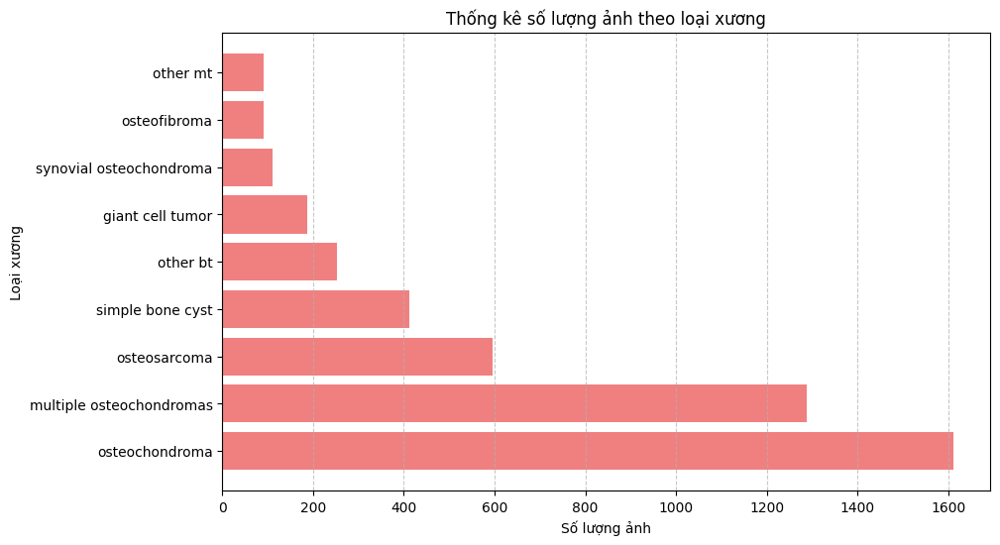

In [24]:
# Đếm số lượng ảnh theo phân loại xương
bone_types = {}

for json_file in json_files:
    json_path = os.path.join(json_dir, json_file)
    with open(json_path, "r", encoding="utf-8") as file:
        data = json.load(file)

    for shape in data["shapes"]:
        label = shape.get("label", "").lower()
        bone_types[label] = bone_types.get(label, 0) + 1

# Chuyển dữ liệu thành DataFrame và vẽ biểu đồ
df_bone = pd.DataFrame(list(bone_types.items()), columns=["Bone Type", "Count"])
df_bone = df_bone.sort_values(by="Count", ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(df_bone["Bone Type"], df_bone["Count"], color="lightcoral")
plt.xlabel("Số lượng ảnh")
plt.ylabel("Loại xương")
plt.title("Thống kê số lượng ảnh theo loại xương")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.show()


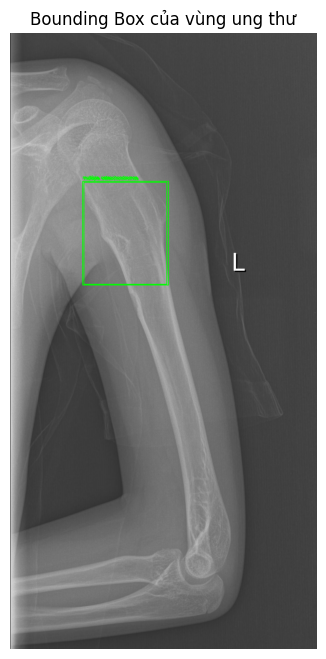

In [25]:
def draw_bounding_boxes(image_path, annotation_data):
    """
    Vẽ bounding box cho ảnh dựa trên annotation
    """
    image = cv2.imread(image_path)
    if image is None:
        print(f"Lỗi: Không thể đọc ảnh {image_path}")
        return

    for shape in annotation_data["shapes"]:
        points = np.array(shape["points"], dtype=np.int32)
        x, y, w, h = cv2.boundingRect(points)
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(image, shape["label"], (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Hiển thị ảnh
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title("Bounding Box của vùng ung thư")
    plt.show()

# Chạy thử với một ảnh mẫu
sample_json = os.path.join(json_dir, json_files[0])
sample_image = os.path.join(image_dir, json_files[0].replace(".json", ".jpeg"))

with open(sample_json, "r", encoding="utf-8") as file:
    sample_annotation = json.load(file)

draw_bounding_boxes(sample_image, sample_annotation)


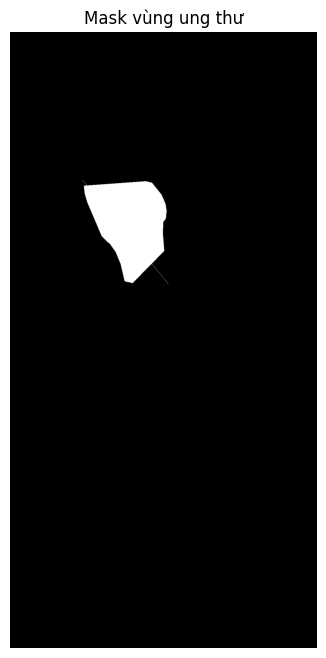

In [26]:
def create_mask(image_shape, annotation_data):
    """
    Tạo mask nhị phân từ annotation
    """
    mask = np.zeros(image_shape[:2], dtype=np.uint8)

    for shape in annotation_data["shapes"]:
        points = np.array(shape["points"], dtype=np.int32)
        cv2.fillPoly(mask, [points], 255)

    return mask

# Tạo mask cho ảnh mẫu
sample_mask = create_mask(cv2.imread(sample_image).shape, sample_annotation)

# Hiển thị mask
plt.figure(figsize=(8, 8))
plt.imshow(sample_mask, cmap="gray")
plt.axis("off")
plt.title("Mask vùng ung thư")
plt.show()


In [27]:
def calculate_tumor_area(annotation_data):
    """
    Tính diện tích vùng ung thư từ annotation
    """
    tumor_area = 0
    for shape in annotation_data["shapes"]:
        points = np.array(shape["points"], dtype=np.int32)
        if len(points) > 2:
            tumor_area += cv2.contourArea(points)
    
    return tumor_area

# Tính diện tích vùng ung thư cho một ảnh mẫu
tumor_area = calculate_tumor_area(sample_annotation)
print(f"Diện tích vùng ung thư: {tumor_area:.2f} pixels²")


Diện tích vùng ung thư: 78948.50 pixels²


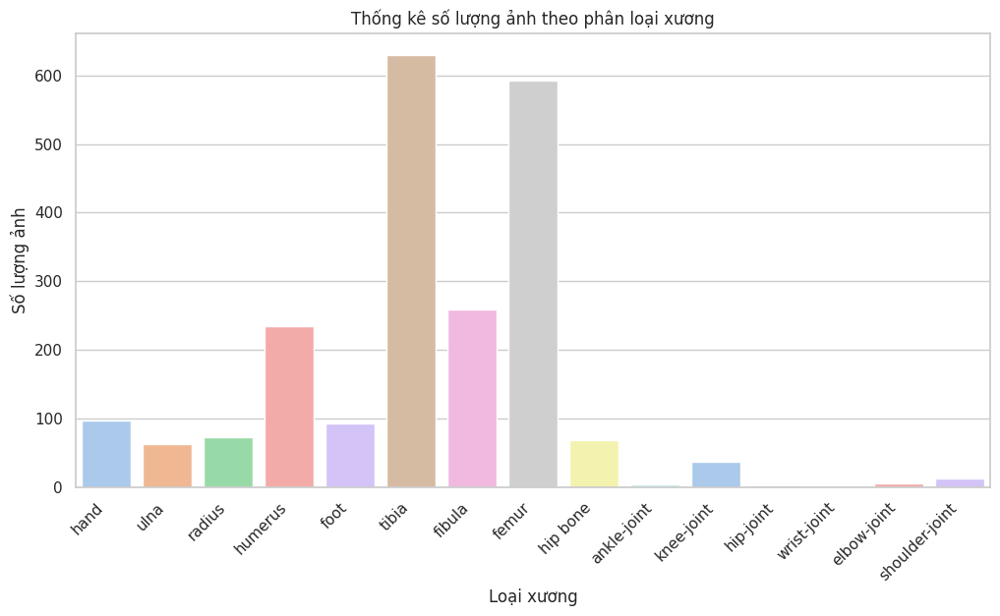

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Đọc file Excel chứa dữ liệu phân loại xương
excel_path = "/kaggle/input/btxrd-data/BTXRD/BTXRD/dataset.xlsx"
df = pd.read_excel(excel_path)

# Danh sách phân loại xương (đảm bảo đúng với tên cột trong dataset.xlsx)
bone_categories = ["hand", "ulna", "radius", "humerus", "foot", "tibia", "fibula", 
                   "femur", "hip bone", "ankle-joint", "knee-joint", "hip-joint", 
                   "wrist-joint", "elbow-joint", "shoulder-joint"]

# Kiểm tra xem các cột này có trong DataFrame không
available_bones = [bone for bone in bone_categories if bone in df.columns]

# Đếm số lượng ảnh theo từng loại xương
bone_counts = df[available_bones].sum()

# Vẽ biểu đồ với seaborn
sns.set_theme(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=bone_counts.index, y=bone_counts.values, palette="pastel")
plt.xticks(rotation=45, ha="right")
plt.xlabel("Loại xương")
plt.ylabel("Số lượng ảnh")
plt.title("Thống kê số lượng ảnh theo phân loại xương")
plt.show()

100%|██████████| 1867/1867 [00:28<00:00, 65.18it/s]
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075:

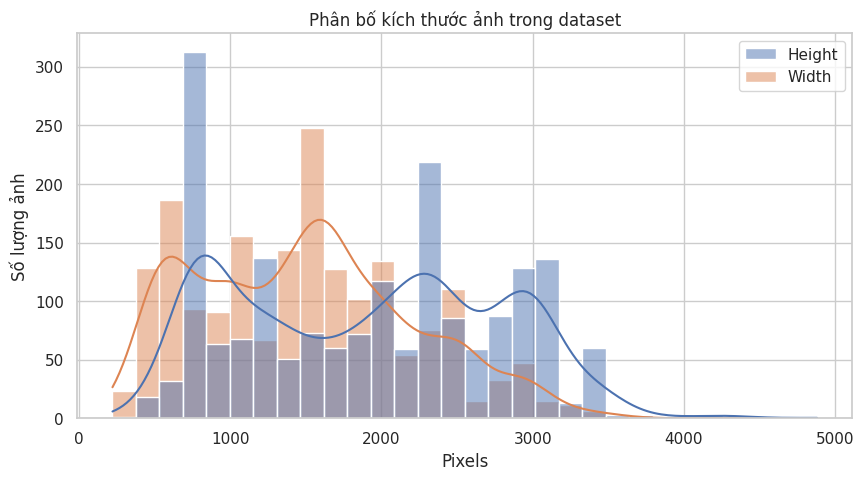

In [34]:
#thống kê kích thước ảnh

# Lấy danh sách kích thước ảnh (width, height)
image_sizes = [cv2.imread(os.path.join(image_dir, data['imagePath'])).shape[:2] for data in tqdm([json.load(open(os.path.join(annotation_dir, f))) for f in os.listdir(annotation_dir)])]

# Chuyển đổi về numpy array
image_sizes = np.array(image_sizes)

# Tạo DataFrame để vẽ biểu đồ
df_sizes = pd.DataFrame(image_sizes, columns=['Height', 'Width'])

# Vẽ biểu đồ kích thước ảnh
plt.figure(figsize=(10, 5))
sns.histplot(df_sizes, kde=True, bins=30)

# Thêm nhãn và tiêu đề
plt.xlabel("Pixels")
plt.ylabel("Số lượng ảnh")
plt.title("Phân bố kích thước ảnh trong dataset")

# Hiển thị biểu đồ
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


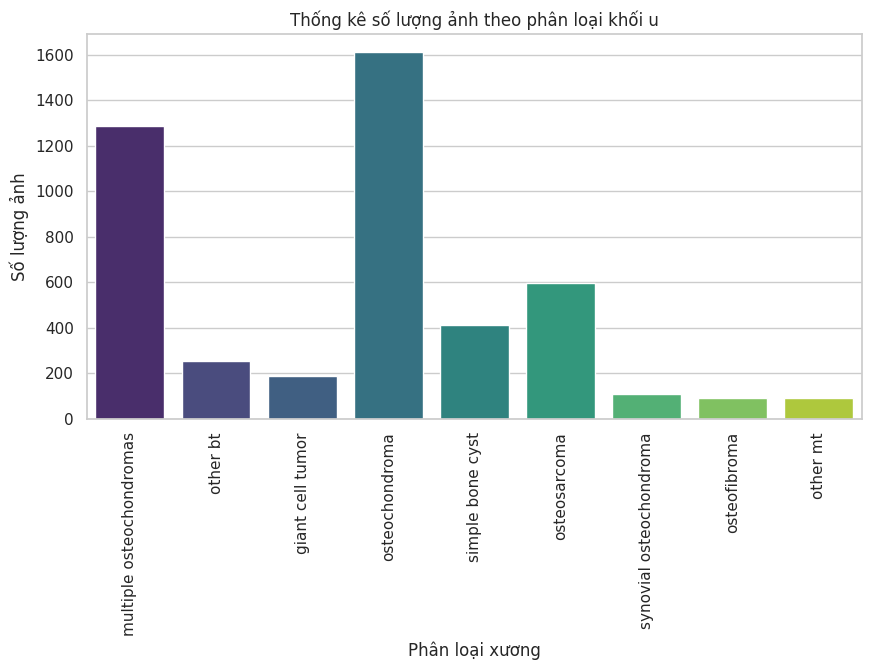

In [35]:
# thống kê số lượng ảnh theo phân loại khối u

from collections import Counter

annotation_dir = '/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations'

# Đọc tất cả các file JSON và lấy nhãn xương
bone_labels = []

for json_file in os.listdir(annotation_dir):
    json_path = os.path.join(annotation_dir, json_file)
    with open(json_path, 'r') as f:
        data = json.load(f)
        labels = [shape["label"] for shape in data["shapes"]]
        bone_labels.extend(labels)

# Đếm số lượng từng loại xương
label_counts = Counter(bone_labels)

plt.figure(figsize=(10, 5))
sns.barplot(x=list(label_counts.keys()), y=list(label_counts.values()), palette="viridis")
plt.xlabel("Phân loại xương")
plt.ylabel("Số lượng ảnh")
plt.title("Thống kê số lượng ảnh theo phân loại khối u")
plt.xticks(rotation=90)
plt.show()

<ipython-input-36-f5bafe16ff88>:38: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_age_cancer = df_merged.groupby(["age_group", "cancer_type"]).size().reset_index(name="count")
<ipython-input-36-f5bafe16ff88>:41: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_total_age = df_merged.groupby("age_group").size().reset_index(name="total_count")
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future 

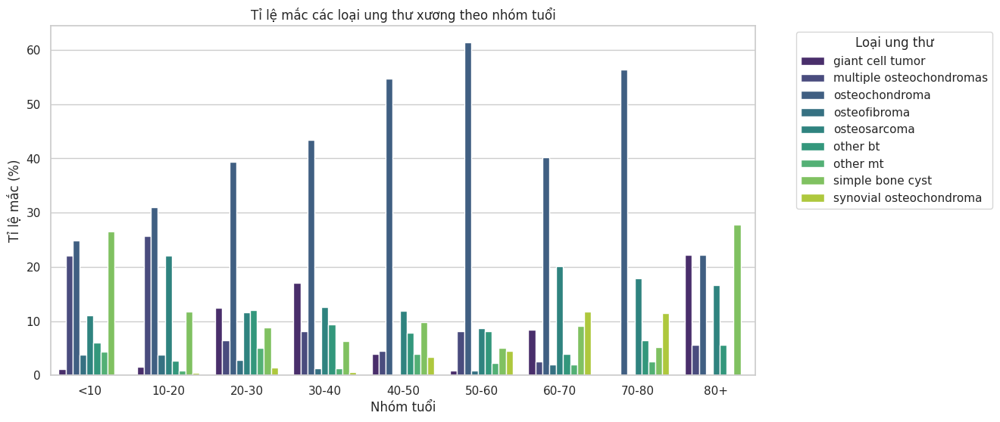

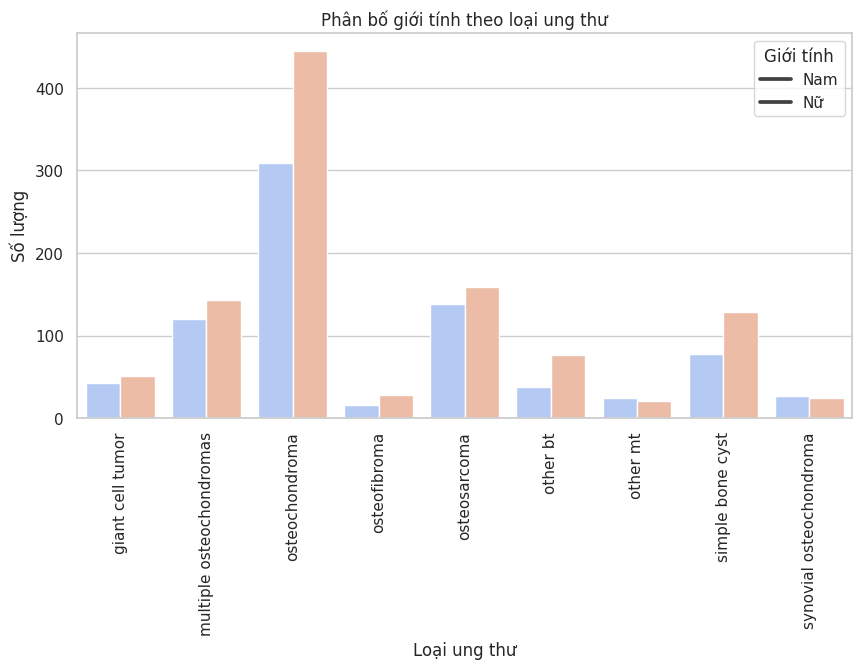

In [36]:
# tỉ lệ mắc các loại ung thư xương ở các độ tuổi và giới tính
import os
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Đọc file Excel
excel_path = '/kaggle/input/btxrd-data/BTXRD/BTXRD/dataset.xlsx'
df_info = pd.read_excel(excel_path, sheet_name=0)  # Sheet 1

# Đọc tất cả các file JSON trong thư mục chứa annotation
annotation_dir = '/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations'
data_list = []

for json_file in os.listdir(annotation_dir):
    json_path = os.path.join(annotation_dir, json_file)
    with open(json_path, "r") as f:
        data = json.load(f)
        image_id = data["imagePath"]
        # Lấy danh sách các nhãn ung thư từ shapes
        labels = [shape["label"] for shape in data["shapes"]]
        for label in set(labels):  # Loại bỏ trùng lặp nhãn trong cùng một ảnh
            data_list.append({"image_id": image_id, "cancer_type": label})

# Tạo DataFrame từ JSON
df_cancer = pd.DataFrame(data_list)

# Gộp dữ liệu từ dataset.xlsx với JSON theo `image_id`
df_merged = df_info.merge(df_cancer, on="image_id", how="inner")

# Chia nhóm tuổi (buckets)
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 100]
labels = ["<10", "10-20", "20-30", "30-40", "40-50", "50-60", "60-70", "70-80", "80+"]
df_merged["age_group"] = pd.cut(df_merged["age"], bins=bins, labels=labels, right=False)

# Tính tỉ lệ mắc ung thư theo từng nhóm tuổi
df_age_cancer = df_merged.groupby(["age_group", "cancer_type"]).size().reset_index(name="count")

# Chuẩn hóa tỉ lệ theo tổng số bệnh nhân trong từng nhóm tuổi
df_total_age = df_merged.groupby("age_group").size().reset_index(name="total_count")
df_age_cancer = df_age_cancer.merge(df_total_age, on="age_group")
df_age_cancer["ratio"] = df_age_cancer["count"] / df_age_cancer["total_count"] * 100  # Tính tỉ lệ %

# Vẽ biểu đồ tỉ lệ mắc ung thư theo nhóm tuổi
plt.figure(figsize=(12, 6))
sns.barplot(x="age_group", y="ratio", hue="cancer_type", data=df_age_cancer, palette="viridis")
plt.xlabel("Nhóm tuổi")
plt.ylabel("Tỉ lệ mắc (%)")
plt.title("Tỉ lệ mắc các loại ung thư xương theo nhóm tuổi")
plt.legend(title="Loại ung thư", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Biểu đồ 2: Phân bố giới tính theo loại ung thư (GIỮ NGUYÊN)
df_gender_count = df_merged.groupby(["cancer_type", "gender"]).size().reset_index(name="count")

plt.figure(figsize=(10, 5))
sns.barplot(x="cancer_type", y="count", hue="gender", data=df_gender_count, palette="coolwarm")
plt.xticks(rotation=90)
plt.xlabel("Loại ung thư")
plt.ylabel("Số lượng")
plt.title("Phân bố giới tính theo loại ung thư")
plt.legend(title="Giới tính", labels=["Nam", "Nữ"])
plt.show()

Đang xử lý JSON: 100%|██████████| 1867/1867 [00:01<00:00, 1325.01file/s]


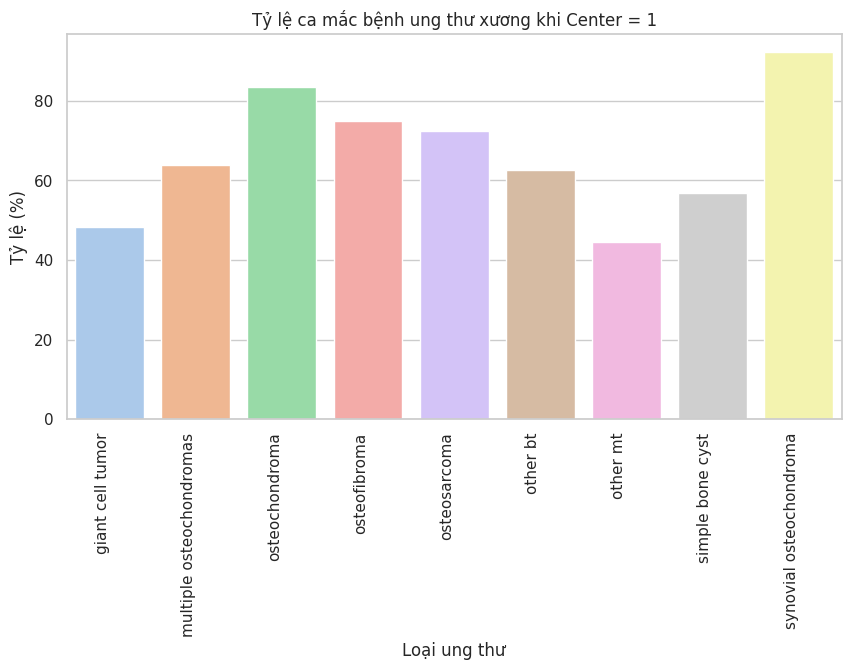

In [37]:
# tỉ lệ center = 1 vs các loại ung thư
import os
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm  # Hiển thị tiến trình

# Đọc file Excel
excel_path = '/kaggle/input/btxrd-data/BTXRD/BTXRD/dataset.xlsx'
df_info = pd.read_excel(excel_path, sheet_name=0)  # Đọc Sheet 1

# Đọc tất cả các file JSON trong thư mục chứa annotation
annotation_dir = '/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations'
data_list = []

for json_file in tqdm(os.listdir(annotation_dir), desc="Đang xử lý JSON", unit="file"):
    json_path = os.path.join(annotation_dir, json_file)
    with open(json_path, "r", encoding="utf-8") as f:
        data = json.load(f)
        image_id = data["imagePath"]
        # Lấy danh sách các nhãn ung thư từ shapes
        labels = [shape["label"] for shape in data["shapes"]]
        for label in set(labels):  # Loại bỏ trùng lặp nhãn trong cùng một ảnh
            data_list.append({"image_id": image_id, "cancer_type": label})

# Tạo DataFrame từ JSON
df_json = pd.DataFrame(data_list)

# Gộp dữ liệu từ dataset.xlsx với JSON theo `image_id`
df_merged = pd.merge(df_info, df_json, on="image_id", how="inner")

# Tính tổng số ca mắc từng loại ung thư
df_total = df_merged.groupby("cancer_type").size().reset_index(name="total_count")

# Tính số ca mắc của `center = 1`
df_center_1 = df_merged[df_merged["center"] == 1].groupby("cancer_type").size().reset_index(name="center_1_count")

# Gộp lại để tính tỷ lệ
df_ratio = pd.merge(df_total, df_center_1, on="cancer_type", how="left").fillna(0)
df_ratio["percentage"] = (df_ratio["center_1_count"] / df_ratio["total_count"]) * 100

# Vẽ biểu đồ cột thể hiện tỷ lệ center = 1 với từng loại ung thư
plt.figure(figsize=(10, 5))
sns.barplot(x="cancer_type", y="percentage", data=df_ratio, palette="pastel")

# Thêm nhãn và tiêu đề
plt.xlabel("Loại ung thư")
plt.ylabel("Tỷ lệ (%)")
plt.title("Tỷ lệ ca mắc bệnh ung thư xương khi Center = 1")
plt.xticks(rotation=90, ha="right")

# Hiển thị biểu đồ
plt.show()

Đang xử lý JSON: 100%|██████████| 1867/1867 [00:01<00:00, 1263.58file/s]


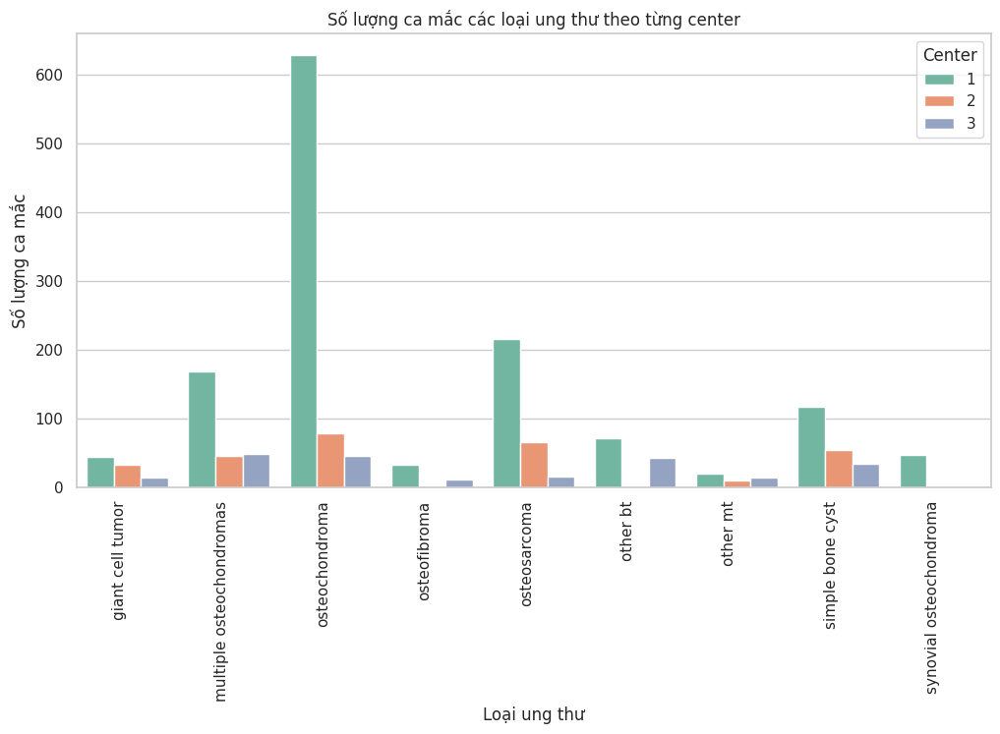

In [38]:
# Số lượng ca mắc các loại ung thư vs center
import os
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm  # Hiển thị tiến trình

# Đọc file Excel
excel_path = '/kaggle/input/btxrd-data/BTXRD/BTXRD/dataset.xlsx'
df_info = pd.read_excel(excel_path, sheet_name=0)  # Đọc Sheet 1

# Đọc tất cả các file JSON trong thư mục chứa annotation
annotation_dir = '/kaggle/input/btxrd-data/BTXRD/BTXRD/Annotations'
data_list = []

for json_file in tqdm(os.listdir(annotation_dir), desc="Đang xử lý JSON", unit="file"):
    json_path = os.path.join(annotation_dir, json_file)
    with open(json_path, "r", encoding="utf-8") as f:
        data = json.load(f)
        image_id = data["imagePath"]
        # Lấy danh sách các nhãn ung thư từ shapes
        labels = [shape["label"] for shape in data["shapes"]]
        for label in set(labels):  # Loại bỏ trùng lặp nhãn trong cùng một ảnh
            data_list.append({"image_id": image_id, "cancer_type": label})

# Tạo DataFrame từ JSON
df_json = pd.DataFrame(data_list)

# Gộp dữ liệu từ dataset.xlsx với JSON theo `image_id`
df_merged = pd.merge(df_info, df_json, on="image_id", how="inner")

# Nhóm dữ liệu theo loại ung thư và center
df_center_count = df_merged.groupby(["cancer_type", "center"]).size().reset_index(name="count")

# Vẽ biểu đồ cột thể hiện tỷ lệ mắc các loại ung thư theo center
plt.figure(figsize=(12, 6))
sns.barplot(x="cancer_type", y="count", hue="center", data=df_center_count, palette="Set2")

# Thêm nhãn và tiêu đề
plt.xlabel("Loại ung thư")
plt.ylabel("Số lượng ca mắc")
plt.title("Số lượng ca mắc các loại ung thư theo từng center")
plt.xticks(rotation=90, ha="right")
plt.legend(title="Center")

# Hiển thị biểu đồ
plt.show()

In [42]:
import pandas as pd

import os
import json

# Đường dẫn đến thư mục dữ liệu
dataset_path = "/kaggle/input/btxrd-data/BTXRD/BTXRD/"
json_dir = os.path.join(dataset_path, "Annotations")

# Lấy danh sách tất cả file JSON
json_files = [f for f in os.listdir(json_dir) if f.endswith(".json")]

# Danh sách các khối u ác tính
malignant_labels = [
    "osteosarcoma", "ewing's sarcoma", "chondrosarcoma", "fibrosarcoma",
    "malignant", "metastatic", "multiple myeloma",
    "giant cell tumor", "dedifferentiated chondrosarcoma"
]

# Biến đếm số lượng khối u
benign_count = 0
malignant_count = 0

# Duyệt qua từng file JSON
for json_file in json_files:
    json_path = os.path.join(json_dir, json_file)

    # Đọc dữ liệu từ JSON
    with open(json_path, "r") as file:
        data = json.load(file)

    # Kiểm tra và phân loại khối u
    if "shapes" in data:
        for shape in data["shapes"]:
            label = shape.get("label", "").lower()  # Chuyển nhãn về chữ thường

            # Nếu nhãn thuộc danh sách ác tính
            if any(word in label for word in malignant_labels):
                malignant_count += 1
            else:
                benign_count += 1  # Mặc định xếp vào nhóm lành tính nếu không phải ác tính

# In kết quả
print(f"Tổng số khối u lành tính: {benign_count}")
print(f"Tổng số khối u ác tính: {malignant_count}")

Tổng số khối u lành tính: 3858
Tổng số khối u ác tính: 784


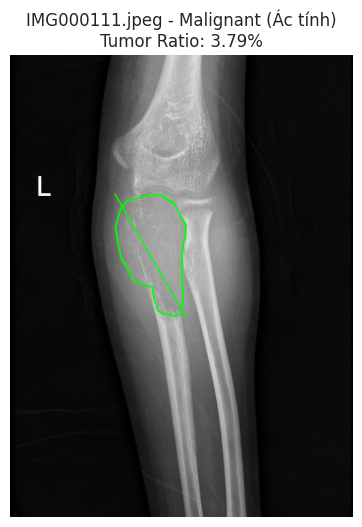

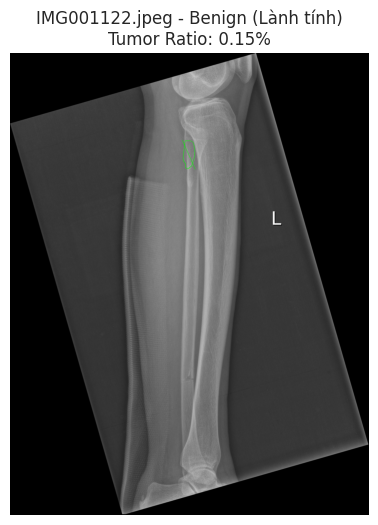

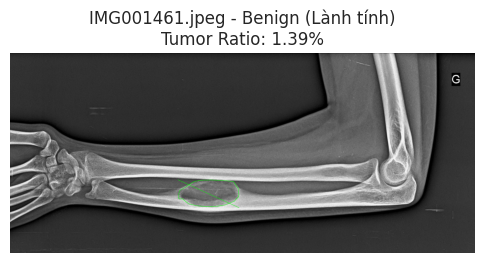

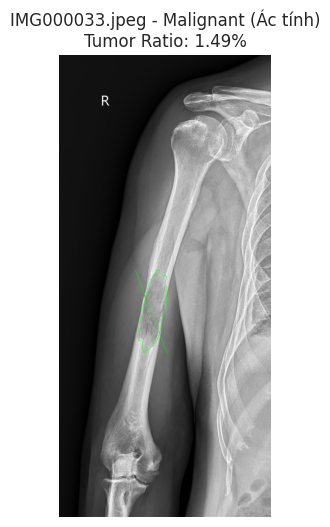

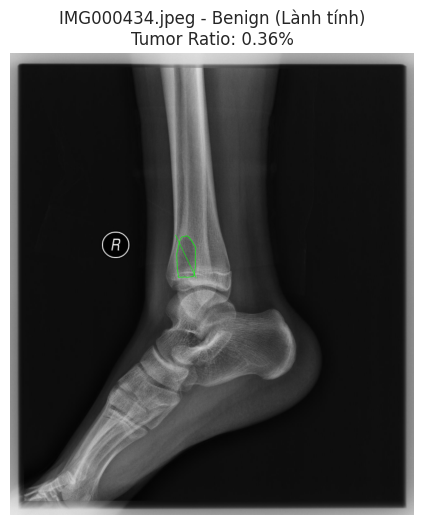

...

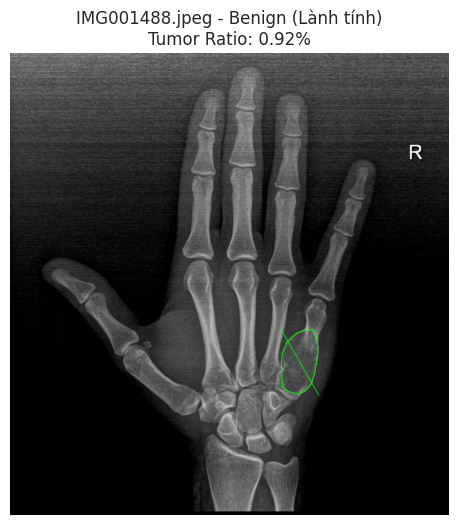

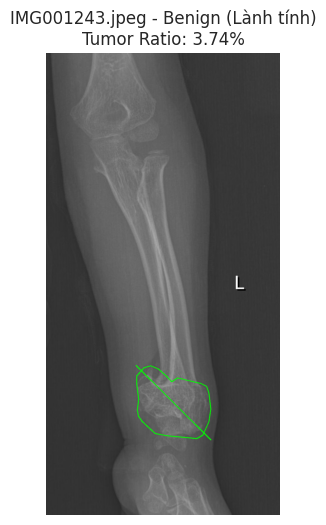

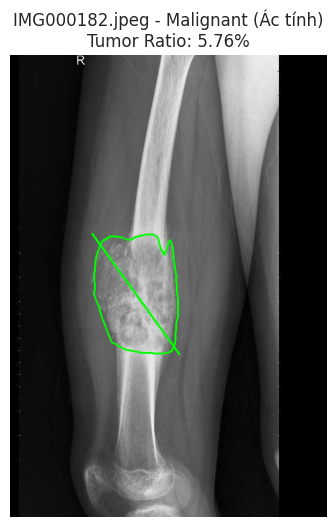

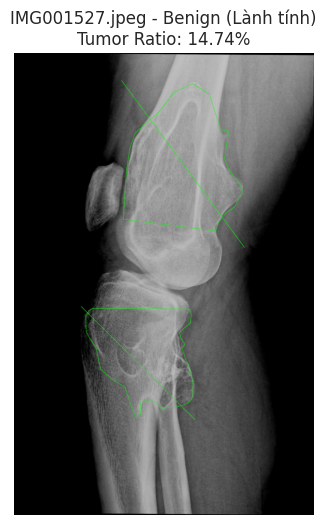

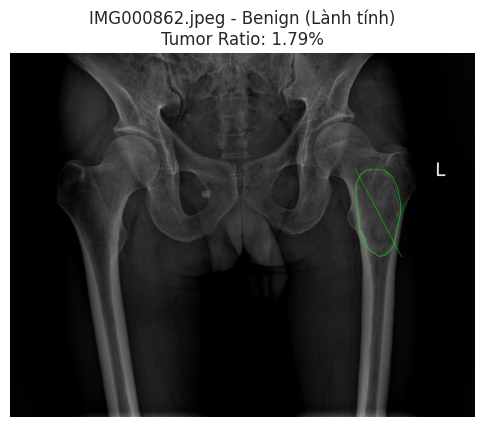

Đã lưu kết quả phân tích 100 ảnh tại: /kaggle/working/tumor_analysis.csv


In [44]:
#xử lý 100 ảnh tính diện tích, diện tích vùng ung thư & xác định loại khối u (lành tính / ác tính)
import os
import json
import random
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Đường dẫn đến thư mục dữ liệu
dataset_path = "/kaggle/input/btxrd-data/BTXRD/BTXRD/"
json_dir = os.path.join(dataset_path, "Annotations")
image_dir = os.path.join(dataset_path, "images")

# Danh sách các nhãn ung thư ác tính
malignant_labels = [
    "osteosarcoma", "ewing's sarcoma", "chondrosarcoma", "fibrosarcoma",
    "malignant", "metastatic", "multiple myeloma", "giant cell tumor", 
    "dedifferentiated chondrosarcoma"
]

# Lấy danh sách tất cả file JSON
json_files = [f for f in os.listdir(json_dir) if f.endswith(".json")]

# Chọn ngẫu nhiên 100 ảnh
random_json_files = random.sample(json_files, min(100, len(json_files)))

# Danh sách lưu kết quả
results = []

# Duyệt qua từng file JSON được chọn
for json_file in random_json_files:
    json_path = os.path.join(json_dir, json_file)

    # Đọc dữ liệu từ JSON
    with open(json_path, "r") as file:
        data = json.load(file)

    # Kiểm tra ảnh tương ứng
    if "imagePath" in data:
        image_path = os.path.join(image_dir, data["imagePath"])
        
        if os.path.exists(image_path):
            image = cv2.imread(image_path)
            height, width, _ = image.shape
            total_pixels = height * width  # Tổng số pixel ảnh
        else:
            continue
    else:
        continue

    # Tính toán diện tích vùng ung thư & xác định loại ung thư
    tumor_area = 0
    tumor_type = "Benign (Lành tính)"  # Mặc định lành tính

    if "shapes" in data:
        for shape in data["shapes"]:
            label = shape.get("label", "").lower()  # Chuyển nhãn về chữ thường
            points = np.array(shape["points"], dtype=np.int32)

            if len(points) > 2:  # Chỉ tính nếu đủ điểm để tạo hình đa giác
                tumor_area += cv2.contourArea(points)

            # Kiểm tra xem nhãn có trong danh sách ác tính không
            if any(malignant in label for malignant in malignant_labels):
                tumor_type = "Malignant (Ác tính)"

    # Tính tỷ lệ vùng ung thư
    tumor_ratio = (tumor_area / total_pixels) * 100 if total_pixels > 0 else 0

    # Lưu vào danh sách kết quả
    results.append({
        "Image": data["imagePath"],
        "Total Pixels": total_pixels,
        "Tumor Area": tumor_area,
        "Tumor Ratio (%)": round(tumor_ratio, 2),
        "Tumor Type": tumor_type
    })

    # Vẽ ảnh với vùng annotation
    img = cv2.imread(image_path)
    for shape in data["shapes"]:
        points = np.array(shape["points"], dtype=np.int32)
        cv2.polylines(img, [points], isClosed=True, color=(0, 255, 0), thickness=2)

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"{data['imagePath']} - {tumor_type}\nTumor Ratio: {tumor_ratio:.2f}%")
    plt.axis("off")
    plt.show()

# Chuyển kết quả thành DataFrame
df_results = pd.DataFrame(results)

# Xuất ra file CSV
csv_output_path = "/kaggle/working/tumor_analysis.csv"
df_results.to_csv(csv_output_path, index=False)

print(f"Đã lưu kết quả phân tích 100 ảnh tại: {csv_output_path}")


In [45]:
#xử lý toàn bộ ảnh
import os
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Đường dẫn đến thư mục dữ liệu
dataset_path = "/kaggle/input/btxrd-data/BTXRD/BTXRD/"
json_dir = os.path.join(dataset_path, "Annotations")
image_dir = os.path.join(dataset_path, "images")

# Danh sách các nhãn ung thư ác tính
malignant_labels = [
    "osteosarcoma", "ewing's sarcoma", "chondrosarcoma", "fibrosarcoma",
    "malignant", "metastatic", "multiple myeloma", "giant cell tumor", 
    "dedifferentiated chondrosarcoma"
]

# Lấy danh sách tất cả file JSON
json_files = [f for f in os.listdir(json_dir) if f.endswith(".json")]

# Danh sách lưu kết quả
results = []

# Xử lý từng ảnh một
for json_file in json_files:
    json_path = os.path.join(json_dir, json_file)

    # Đọc dữ liệu từ JSON
    with open(json_path, "r") as file:
        data = json.load(file)

    # Kiểm tra ảnh tương ứng
    if "imagePath" in data:
        image_path = os.path.join(image_dir, data["imagePath"])
        
        if os.path.exists(image_path):
            image = cv2.imread(image_path)
            height, width, _ = image.shape
            total_pixels = height * width  # Tổng số pixel ảnh
        else:
            print(f"Ảnh {data['imagePath']} không tồn tại!")
            continue
    else:
        print("Không tìm thấy đường dẫn ảnh trong file JSON!")
        continue

    # Tính toán diện tích vùng ung thư & xác định loại ung thư
    tumor_area = 0
    tumor_type = "Benign (Lành tính)"  # Mặc định là lành tính

    if "shapes" in data:
        for shape in data["shapes"]:
            label = shape.get("label", "").lower()  # Chuyển nhãn về chữ thường
            points = np.array(shape["points"], dtype=np.int32)

            if len(points) > 2:  # Chỉ tính nếu đủ điểm để tạo hình đa giác
                tumor_area += cv2.contourArea(points)

            # Kiểm tra xem nhãn có trong danh sách ác tính không
            if any(malignant in label for malignant in malignant_labels):
                tumor_type = "Malignant (Ác tính)"  # Nếu có bất kỳ nhãn nào trùng, chuyển thành ác tính

    # Tính tỷ lệ vùng ung thư
    tumor_ratio = (tumor_area / total_pixels) * 100 if total_pixels > 0 else 0

    # Lưu kết quả vào danh sách
    results.append({
        "Image": data["imagePath"],
        "Total Pixels": total_pixels,
        "Tumor Area": tumor_area,
        "Tumor Ratio (%)": round(tumor_ratio, 2),
        "Tumor Type": tumor_type
    })

# Tạo DataFrame từ kết quả
df_results = pd.DataFrame(results)

# Xuất dữ liệu thành file CSV
csv_output_path = "/kaggle/working/tumor_analysis.csv"
df_results.to_csv(csv_output_path, index=False)

print(f"Đã lưu file CSV: {csv_output_path}")


Đã lưu file CSV: /kaggle/working/tumor_analysis.csv


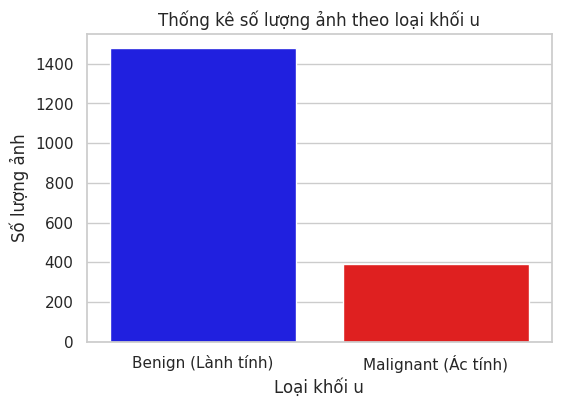

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


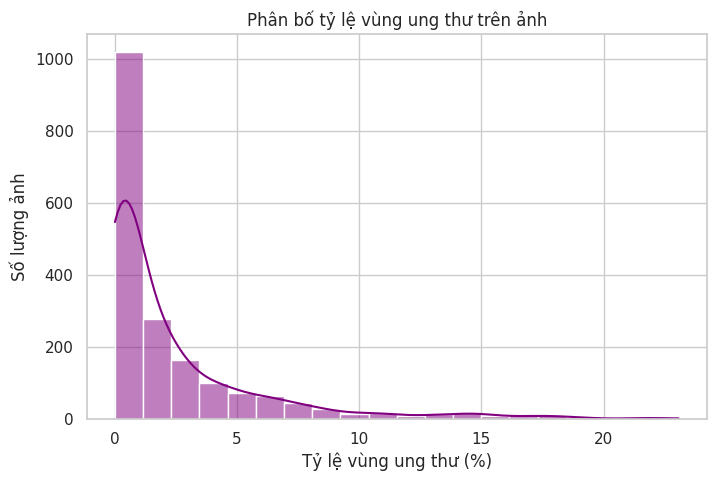

In [46]:
# Biểu đồ thống kê số lượng ảnh theo loại khối u
plt.figure(figsize=(6, 4))
sns.countplot(x="Tumor Type", data=df_results, palette=["blue", "red"])
plt.title("Thống kê số lượng ảnh theo loại khối u")
plt.xlabel("Loại khối u")
plt.ylabel("Số lượng ảnh")
plt.show()

# Biểu đồ phân bố tỷ lệ vùng ung thư trên ảnh
plt.figure(figsize=(8, 5))
sns.histplot(df_results["Tumor Ratio (%)"], bins=20, kde=True, color="purple")
plt.title("Phân bố tỷ lệ vùng ung thư trên ảnh")
plt.xlabel("Tỷ lệ vùng ung thư (%)")
plt.ylabel("Số lượng ảnh")
plt.show()


In [ ]:
# Đọc file JSON
json_path = os.path.join(json_dir, "IMG000003.json")  # Thay bằng tên JSON cụ thể
with open(json_path, "r") as f:
    data = json.load(f)

# Lấy đường dẫn ảnh từ JSON
image_path = os.path.join(image_dir, data["imagePath"])  

# Kiểm tra và đọc ảnh
if os.path.exists(image_path):  
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Chuyển từ BGR sang RGB để hiển thị đúng màu
else:
    print(f"Không tìm thấy ảnh: {image_path}. Tạo ảnh nền trắng.")
    img = np.ones((data["imageHeight"], data["imageWidth"], 3), dtype=np.uint8) * 255  

# Hiển thị ảnh
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.title("Ảnh ban đầu")
plt.axis("off")
plt.show()

In [ ]:
# Tạo mask (ảnh đen) cùng kích thước với ảnh gốc
mask = np.zeros_like(img, dtype=np.uint8)

# Duyệt qua các hình trong JSON và vẽ lên mask
for shape in data["shapes"]:
    points = np.array(shape["points"], dtype=np.int32)  # Chuyển về numpy array

    if shape["shape_type"] == "polygon" and len(points) >= 3:
        cv2.fillPoly(mask, [points], color=255)  # Đổ màu trắng vào mask

# Hiển thị ảnh gốc và mask
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap="gray")
plt.title("Ảnh gốc")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mask, cmap="gray")
plt.title("Mask từ JSON")
plt.axis("off")
plt.show()